# Import

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
if 'google.colab' in str(get_ipython()):
    import subprocess, sys
    subprocess.run('git clone https://github.com/ringolee0823/STAT5106.git', shell=True)
    subprocess.run('pip install spotipy requests_html', shell=True)
    subprocess.run('mkdir "/content/STAT5106/Spotify Chart Data"', shell=True)
    sys.path.append("/content/STAT5106")

In [3]:
from Scraper_Ranking import Rankings
from Scraper_Feature import Features
from Spotify_Project import get_country_codes, get_happiness_index, get_data_dir
get_data_dir();

In [4]:
import calendar, math, re, requests_html

import numpy as np
import pandas as pd

from cycler import cycler
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.gridspec as grid_spec

import seaborn as sns

import plotly.express as px

from sklearn.neighbors import KernelDensity
from sklearn.preprocessing import StandardScaler # feature standardisation

%matplotlib inline
plt.style.use('fivethirtyeight')
mpl.rcParams.update(
    {
        'font.size': 11,
        'lines.linewidth': 2,
        'figure.facecolor': '#fafafa', 
        'axes.facecolor': '#fafafa', 
        'axes.spines.left': False,
        'axes.spines.bottom': False,
        'axes.spines.top': False,
        'axes.spines.right': False
    }
)

# Data Cleaning

## Individual Dataset

### Ranking

In [5]:
rankings = Rankings()

In [6]:
df_rankings = pd.read_feather(rankings.data_dir / 'df_rankings')
df_rankings.date = pd.to_datetime(df_rankings.date)
df_rankings.tail(3).T

,20461242,20461243,20461244
date,2021-12-15 00:00:00,2021-12-15 00:00:00,2021-12-15 00:00:00
country_code,za,za,za
position,198,199,200
artist,Juice WRLD,Juice WRLD,"Lil Tjay, 6LACK"
track,Feline (with Polo G & Trippie Redd),Wishing Well,Calling My Phone
track_id,5R4Yrc2j4jw1itr4hKcN26,2U5WueTLIK5WJLD7mvDODv,3J8EOeKLTLXORtWPpOU5bE
streams,3659,3611,3609


In [7]:
n_rows_rankings = len(df_rankings)
f'No of records: {n_rows_rankings:,}'

'No of records: 20,461,245'

### Country Code

In [8]:
df_country_codes = get_country_codes()
df_country_codes[df_country_codes['country_code'] == "hk"]

,country_code,country_code_alpha3,region_name,sub_region_name,languages_name,country
47,hk,HKG,Asia,Eastern Asia,Chinese,Hong Kong


### Track Information

In [9]:
df_track_info = pd.read_csv(rankings.data_dir / 'df_track_info.csv')
df_track_info.head(3).T

,0,1,2
track_id,4NM72r7orR4QPkgox7astH,71O9WhK2KDKAeD6ZigPIuB,1YauIq10SwPGqTtkS6bywR
track_popularity,67,45,24
artists_name,Bastille,Tia Ray,J. Karjalainen
artists_id,7EQ0qTo7fWT7DPxmxtSYEc,70paW48PtCtUjtndElrjrL,03WFRA66hsZpJ5rqylE0vQ
album_id,6QwZ44ldGwp9W7DoJ8bwyw,4tNABtO1IjRcguQA28sP8b,4OKlQgV3dMjwETwtThiT2q
album_release_date,2021-10-19,2018-07-18,2018-10-17
image_640,https://i.scdn.co/image/ab67616d0000b2734e01a2...,https://i.scdn.co/image/ab67616d0000b27373d633...,https://i.scdn.co/image/ab67616d0000b273e9438f...


### Audio Feature

In [10]:
list_features = [
    'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
    'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'
]

In [11]:
df_features = pd.read_csv(rankings.data_dir / 'df_features.csv')[list_features+['track_id']]
df_features.head(3).T

,0,1,2
danceability,0.329,0.609,0.77
energy,0.0879,0.639,0.602
key,4,8,6
loudness,-23.27,-4.662,-8.238
mode,1,0,1
speechiness,0.0504,0.0682,0.251
acousticness,0.994,0.357,0.018
instrumentalness,0.00524,0.0,0.000073
liveness,0.0811,0.239,0.102
valence,0.251,0.211,0.823


### Track Genre

In [12]:
df_genre = pd.read_csv(rankings.data_dir / 'df_genre.csv')
df_genre = df_genre.groupby('track_id', as_index=False)[['genre']].agg(lambda x: ', '.join(sorted(set(x))))
df_genre.head(3).T

,0,1,2
track_id,000NcmImetfaUDMhyzvlSh,000xQL6tZNLJzIrtIgxqSl,0016o3OMJKPrDKj6yFwkGs
genre,minimal-techno,pop,afrobeat


### Happiness Index

In [13]:
df_happiness_index = get_happiness_index()
df_happiness_index.head(3).T

,0,1,2
country,Burundi,Central African Republic,South Sudan
year,2017,2017,2017
happiness_score,2.9045,3.083,3.2542
log_gdp_per_capita,0.090806,0.023905,0.33737
social_support,0.626902,0.0,0.607502
healthy_life_expectancy,0.145325,0.0101,0.17746
freedom_to_make_life_choices,0.06485,0.30528,0.111604
generosity,0.148904,0.218356,0.223926
perceptions_of_corruption,0.075953,0.038344,0.105675
dystopia_+_residual,1.751794,2.487011,1.690625


In [14]:
df_happiness_index_2020 = df_happiness_index[df_happiness_index['year'] == '2020']
df_happiness_index_2020 = \
    df_happiness_index_2020.merge(df_country_codes[['country_code', 'country_code_alpha3', 'country']], how='left', on='country')
df_happiness_index_2020.tail(3).T

,146,147,148
country,Switzerland,Denmark,Finland
year,2020,2020,2020
happiness_score,7.5715,7.6195,7.8421
log_gdp_per_capita,1.565899,1.501548,1.446356
social_support,1.079469,1.108008,1.106192
healthy_life_expectancy,0.816415,0.762862,0.740824
freedom_to_make_life_choices,0.653488,0.68616,0.690577
generosity,0.20404,0.207615,0.1242
perceptions_of_corruption,0.413019,0.484993,0.480524
dystopia_+_residual,2.839148,2.868296,3.253415


## Combined Dataset

### Valence

In [15]:
df_valence = df_rankings.merge(df_features[['track_id', 'valence']], how='inner', on='track_id')
f'Number of lines in df_rankings without audio features {n_rows_rankings - len(df_valence)}'

'Number of lines in df_rankings without audio features 479'

In [16]:
df_valence = df_valence.merge(df_country_codes, how='left', on='country_code')
df_valence[df_country_codes.columns] = df_valence[df_country_codes.columns].fillna('Global')
df_valence.head(1).T

,0
date,2017-01-01 00:00:00
country_code,ar
position,1
artist,Shakira
track,Chantaje (feat. Maluma)
track_id,6mICuAdrwEjh6Y6lroV2Kg
streams,253019
valence,0.907
country_code_alpha3,ARG
region_name,Americas


### Feature Melt

In [17]:
df_melt = \
    df_rankings[df_rankings["country_code"]=='global']. \
        merge(df_features, how='inner', on='track_id'). \
        melt('date', list_features)
df_melt = df_melt.groupby(['date', 'variable'], as_index=False).mean()
df_melt.head(1)

,date,variable,value
0,2017-01-01,acousticness,0.173412


### Stream

In [18]:
df_streams = \
    df_rankings. \
        groupby(['track_id', 'track', 'artist', 'country_code'], as_index=False)[['streams']].sum(). \
        sort_values('streams', ascending=False). \
        merge(df_features[list_features+['track_id']], how='inner', on='track_id'). \
        merge(df_country_codes[['country_code', 'country']], how='left', on='country_code')
df_streams['country'] = df_streams['country'].fillna('Global')
df_streams.to_feather(rankings.data_dir / 'df_streams')
df_streams.head(1)

,track_id,track,artist,country_code,streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,country
0,7qiZfU4dY1lWllzX7mPBI3,Shape of You,Ed Sheeran,global,2917236496,0.825,0.652,1,-3.183,0,0.0802,0.581,0.0,0.0931,0.931,95.977,Global


### Stream - Global

In [19]:
def scale_features(df_raw):
    df = df_raw.copy()
    for f in list_features:
        df[f] = (df[f] - df[f].mean()) / (df[f].std())
    return df

def weighted_average(x, df=df_streams, on='streams'):
    return np.average(x, weights=df_valence.loc[x.index, on])

In [20]:
df_streams_global = df_streams[df_streams.country_code == 'global']
df_streams_global = scale_features(df_streams_global)
df_streams_global.reset_index(drop=True, inplace=True)
df_streams_global.to_feather(rankings.data_dir / 'df_streams_global')
df_streams_global.head(1)

,track_id,track,artist,country_code,streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,country
0,7qiZfU4dY1lWllzX7mPBI3,Shape of You,Ed Sheeran,global,2917236496,1.012109,0.104927,-1.152256,1.258963,-1.182868,-0.424622,1.430838,-0.160526,-0.625909,1.986848,-0.891247,Global


### Stream - Country

In [21]:
df_streams_country = \
    df_streams. \
        groupby(['country_code', 'country'], as_index=False)[list_features].agg(weighted_average)

In [22]:
list_country = df_rankings.groupby('country_code')['streams'].sum().sort_values(ascending=False).index[:16] 
dict_country = {c: i for i, c in enumerate(list_country, 1)}

In [23]:
df_streams_country = df_streams_country[df_streams_country['country_code'].isin(list_country)]
df_streams_country['sort'] = df_streams_country['country_code'].map(dict_country)
df_streams_country.sort_values('sort', inplace=True)

In [24]:
df_streams_country = scale_features(df_streams_country)
df_streams_country.head(1)

,country_code,country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,sort
24,global,Global,0.248002,-0.108581,-0.272487,0.237727,0.092601,0.24373,-0.400605,-1.138276,-0.275375,-0.132707,-0.290984,1


### Stream - 2020

In [25]:
# # to save time for re-calculating the result

# # get 2020 ranking record, filter out global ranking and then 
# # find out the weighted average of song features by no of streams
# # weighted by number of streams that song had in 2020
# # result shall be by-country song features in 2020
# df_rankings_2020 = df_rankings[df_rankings.date.dt.year == 2020]
# df_streams_2020 = \
#     df_rankings_2020. \
#         groupby(['track_id', 'country_code'], as_index=False)[['streams']].sum(). \
#         merge(df_features[list_features+['track_id']], how='inner', on='track_id')
# df_streams_2020 = df_streams_2020[df_streams_2020['country_code'] != 'global']

# df_streams_2020 = \
#     df_streams_2020. \
#         groupby(['track_id', 'country_code'], as_index=False)[list_features].agg(weighted_average)

In [26]:
# ## merge with 2020 happiness index to see if there is any relationship 
# ## between song features and happiness index
# df_SF_HI_2020 = df_streams_2020.merge(df_happiness_index_2020, how='inner', on='country_code')
# df_SF_HI_2020.columns = df_SF_HI_2020.columns.str.replace("_", " ")

In [27]:
# df_SF_HI_2020.to_feather(rankings.data_dir / 'df_SF_HI_2020')
df_SF_HI_2020 = pd.read_feather(rankings.data_dir / 'df_SF_HI_2020')

# Charts

## Setting

In [28]:
dict_period = {'month': [('2', '#191414', '#1db954', 'February'), 
                         ('8', '#ffffff', '#1db954', 'August'), 
                         ('12', '#1db954', '#191414', 'December')],
               'week': [('0', '#008fd5', 'Monday'), 
                        ('4', '#e5ae38', 'Friday'), 
                        ('6', '#fc4f30', 'Sunday')]}

illustrate_scale = u' \u2190 {}         {}         {} \u2192 '   

## Happiness Index Choropleth

### code

In [29]:
def plot_choropleth(df, 
                    tuple_value=('happiness_score',  'Happiness Index')):
    
    fig = px.choropleth(df, 
        locations='country_code_alpha3', 
        hover_name="country",
        hover_data=["country", tuple_value[0]],
        color=tuple_value[0],
        color_continuous_scale="Viridis",
        range_color=(df[tuple_value[0]].min(), 
                     df[tuple_value[0]].max()),
        projection="mercator",
        scope="world",
        labels={
            'country_code_alpha3': 'Country Code',
            'country': 'Country',
            tuple_value[0]: tuple_value[1]
        }
    )

    fig.update_geos(
        visible=False,
        showcountries=True,
        lataxis_range=[-5, 90], 
        lonaxis_range=[-20, 345]
    )

    fig.update_layout(
        height=800, 
        margin={"r":0,"t":0,"l":0,"b":0},
        coloraxis_colorbar=dict(
            thicknessmode="pixels", 
            thickness=20,
            lenmode="pixels", 
            len=350,
            x=0.9,
            xpad=0,
            xanchor="left",
            yanchor="middle",
            ticks="outside", 
            ticksuffix="",
            dtick=df[tuple_value[0]].mean()
        )
    )

    fig.show()
    
    return fig

### chart

In [30]:
%%time
f = plot_choropleth(df_happiness_index_2020, 
                    tuple_value=('happiness_score',  'Happiness\nIndex\nin\n2020'));

CPU times: user 354 ms, sys: 170 ms, total: 524 ms
Wall time: 817 ms


In [31]:
%%time
f = plot_choropleth(df_valence.groupby(['country_code_alpha3', 'country'], as_index=False). \
                        agg({'valence': weighted_average}, df=df_valence), 
                    tuple_value=('valence',  'Spotify Song Valence'));

CPU times: user 6.9 s, sys: 1.55 s, total: 8.44 s
Wall time: 8.76 s


## Correlation

### chart

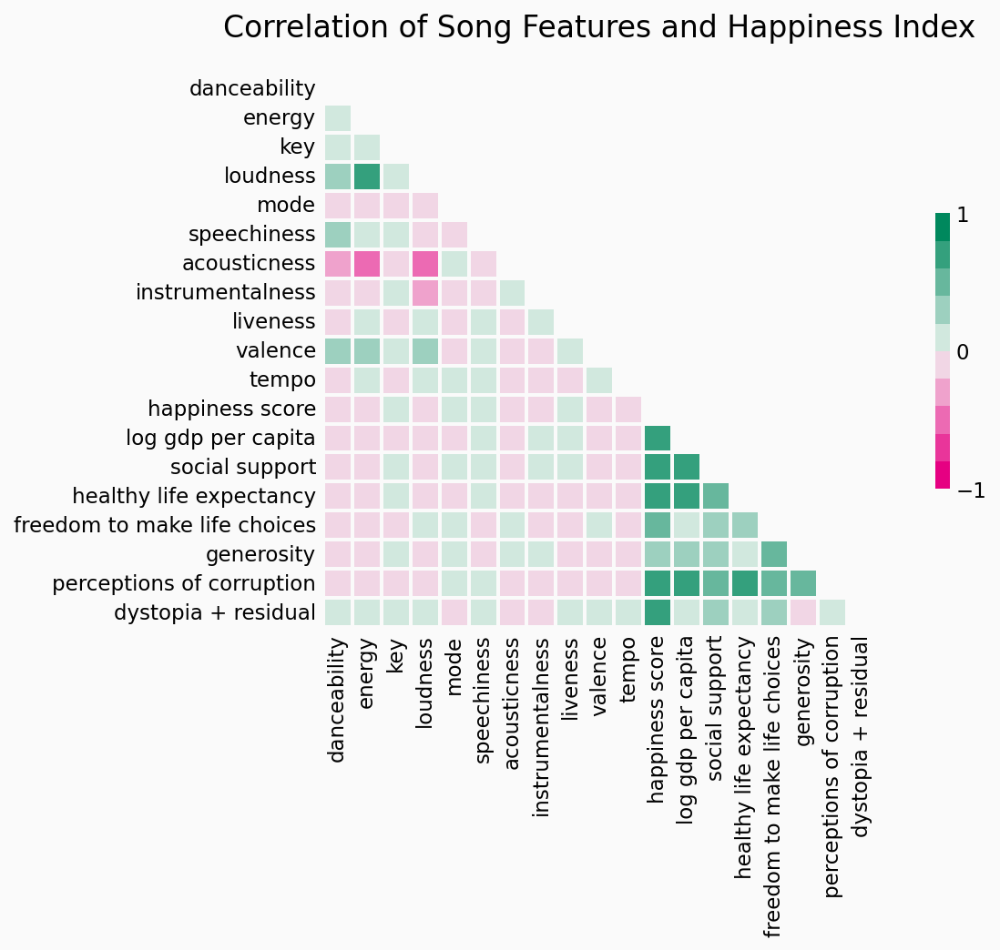

In [32]:
fig, ax = plt.subplots(figsize=(10,5), dpi=150)
mask = np.triu(np.ones_like(df_SF_HI_2020.corr(), dtype=bool))
chart = sns.heatmap(df_SF_HI_2020.corr(), 
                    mask=mask, 
                    square=True, 
                    cmap=sns.diverging_palette(350, 150, s=100, l=50, n=10),#, as_cmap=True),
                    linewidths=1,
                    linecolor='#fafafa',
                    center=0, 
                    vmin=-1, 
                    vmax=1, 
                    cbar_kws=dict(
                        ticks=[-1, 0, 1],
                        orientation='vertical', 
                        label="", 
                        shrink=.5
                    ), 
                    ax=ax)
ax.set_title('Correlation of Song Features and Happiness Index', pad=20);

## Features Trend

### code

In [33]:
def plot_features_trend(df, x=df_melt.date.dt.month_name().str[:3]):

    # Plot each year's time series in its own facet
    chart = sns.relplot(
        data=df[df["variable"] != "key"],
        x=x, 
        y="value", 
        col='variable', 
        hue=None,
        kind="line", 
        color='#1db954', 
        linewidth=4, 
        zorder=0,
        col_wrap=5, 
        height=3, 
        aspect=1.5, 
        legend=False, 
        facet_kws={'sharey': False, 'sharex': True}
    )

    # Iterate over each subplot to customize further
    for text, ax in chart.axes_dict.items():

        # Add the title as an annotation within the plot
        ax.text(0.1, .85, text, transform=ax.transAxes, fontweight="bold", fontsize=20)
        ax.grid(False)

    # Reduce the frequency of the x axis ticks
    ax.set_xticks(ax.get_xticks()[::2])
    chart.set_xlabels("")
    chart.set_ylabels("")
    chart.set_yticklabels("")

    # Tweak the supporting aspects of the plot
    chart.set_titles("")
    chart.tight_layout()

    plt.figure(dpi=200)
    
    return None 

### chart

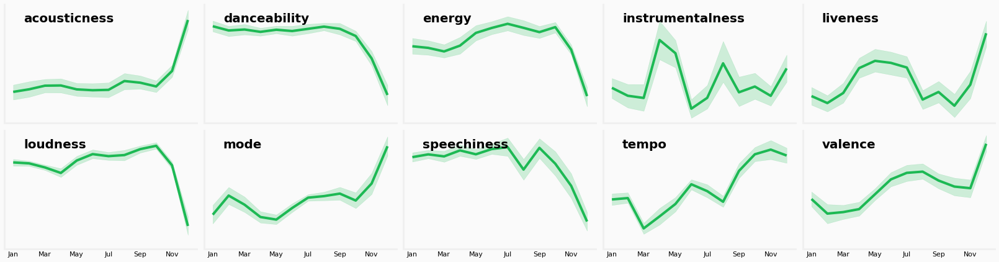

<Figure size 1200x800 with 0 Axes>

In [34]:
plot_features_trend(df_melt, x=df_melt.date.dt.month_name().str[:3]);

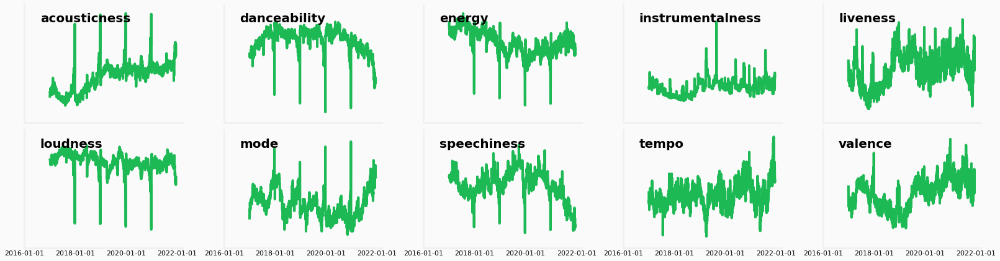

<Figure size 1200x800 with 0 Axes>

In [35]:
plot_features_trend(df_melt, x=df_melt.date);

## Spider Chart

### code

In [36]:
def plot_spider(df_raw, 
                n_col=4, 
                categories=list_features,
                title=['track', 'artist', 'streams'],
                title_style='default',
                figsize=(10, 5), 
                dpi=200):

    df = df_raw.copy()
    
    # number of categories
    n_categories = len(categories) 
    # allowable number of row
    n_row = len(df.index) // n_col
    
    # Create a color palette:
    my_palette = ['#191414', '#1db954'] + plt.rcParams['axes.prop_cycle'].by_key()['color'] 
    my_palette = my_palette * 10

    def plot_(df_raw, idx, title, color):

        # the angle of each axis in the plot
        angles = [n / float(n_categories) * 2 * math.pi for n in range(n_categories)]
        angles += angles[:1]

        # initialise the spider plot
        ax = plt.subplot(n_row, n_col, idx+1, polar=True)
        ax.set_theta_offset(math.pi / 2)
        ax.set_theta_direction(-1)

        # draw one axe per variable + add labels labels yet
        plt.xticks(angles[:-1], categories, color='grey', size=n_categories/2.25)

        # draw ylabels
        ax.set_rlabel_position(0)
        plt.yticks(color="grey", size=1)

        # insert values
        values = df[categories].iloc[idx].values.flatten().tolist()
        values += values[:1]
        ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
        ax.fill(angles, values, color=color, alpha=0.8)

        # Add a title
        plt.title(title, color=color, y=1.1, pad=10, size=10)
 
    fig = plt.figure(figsize=figsize, dpi=dpi)
     
    dict_title = df[title].reset_index(drop=True).to_dict()
    
    for i in range(0, n_row * n_col):
        
        title_text = []
        
        if title_style == 'default':
            for k in dict_title:
                title_text.append(dict_title[k][i])
            title_text = '\n'.join(title_text)
        
        elif title_style == 'streams':
            title_text = f"{dict_title['track'][i]}\n{dict_title['artist'][i]}\nPlayed: {dict_title['streams'][i]:,} of times"
        
        plot_(df, 
              idx=i, 
              title=title_text,
              color=my_palette[i])
        
    fig.tight_layout(pad=1.0)

### chart

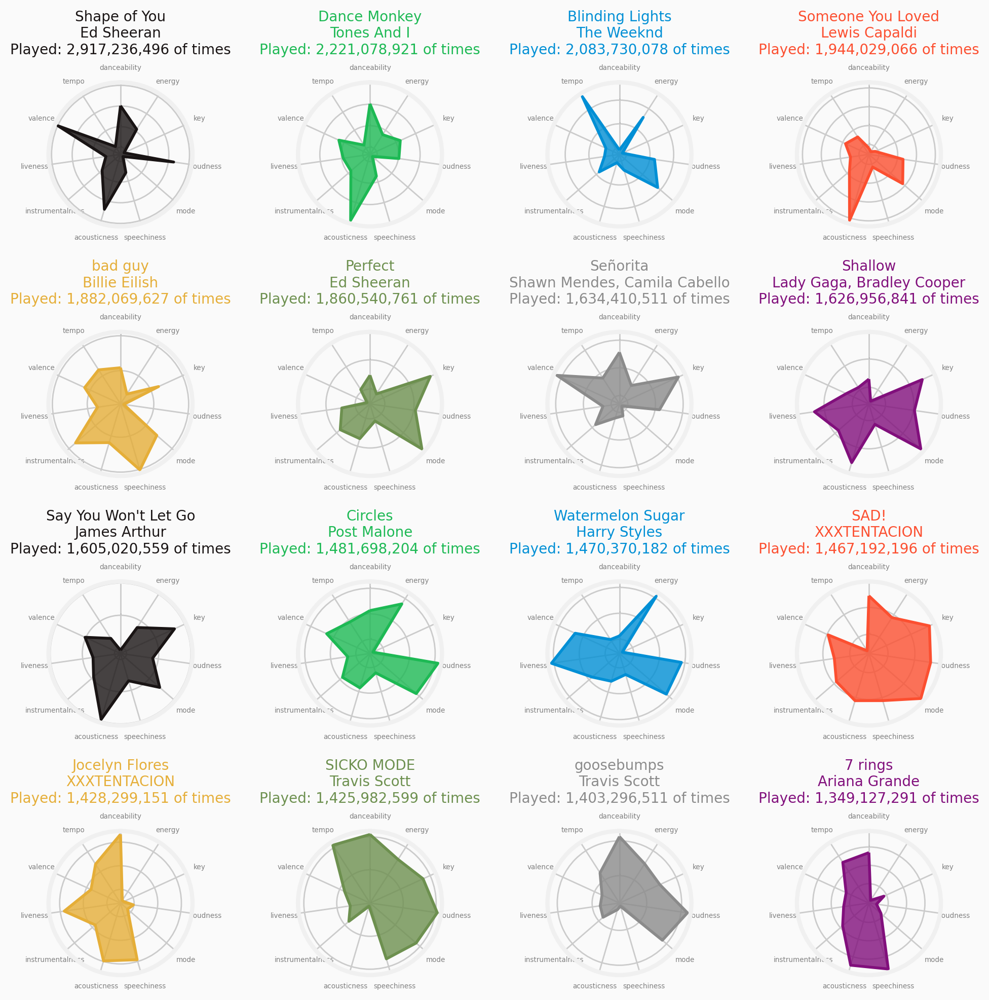

In [37]:
plot_spider(df_streams_global[:16], 
            n_col=4, 
            categories=list_features,
            title=['track', 'artist', 'streams'],
            title_style='streams',
            figsize=(10, 10), 
            dpi=200)

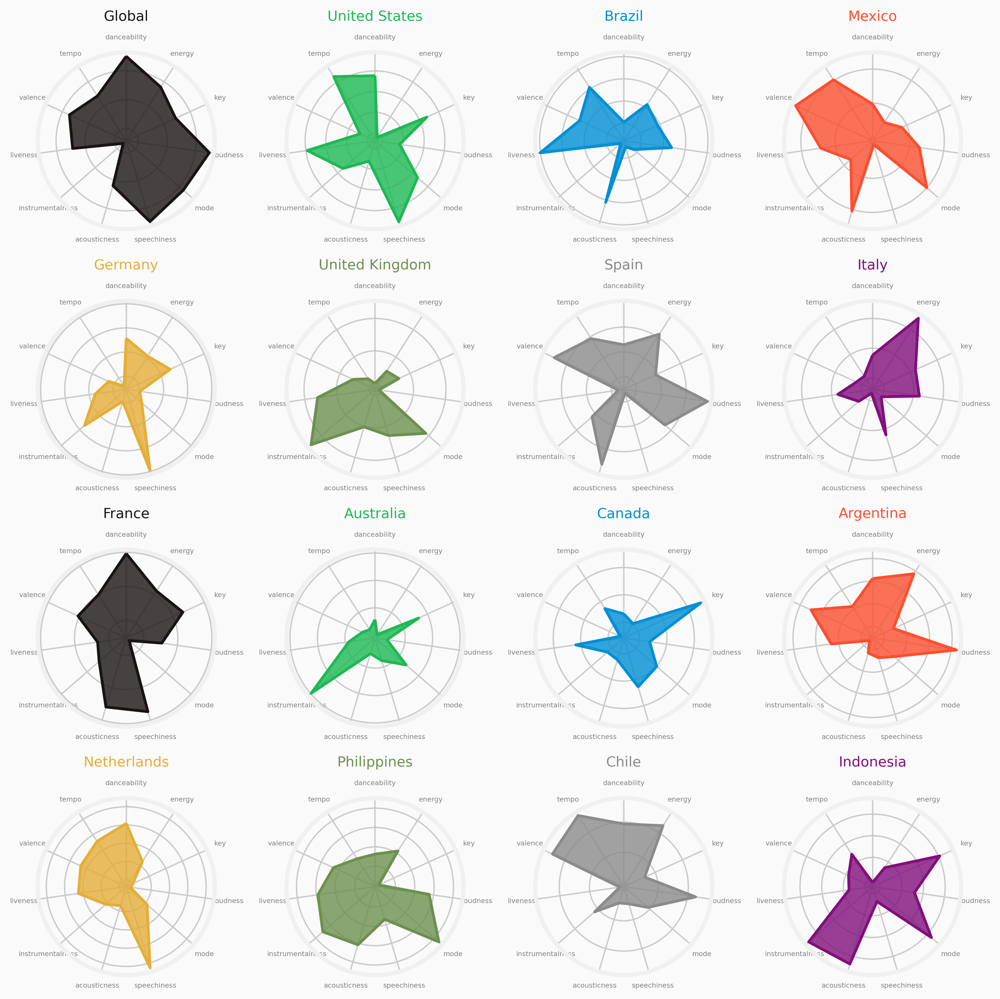

In [38]:
plot_spider(df_streams_country, 
            n_col=4, 
            categories=list_features,
            title=['country'],
            title_style='default',
            figsize=(10, 10), 
            dpi=400)

## 10-Day Rolling Average

### code

In [39]:
def plot_moving_average(df, 
                        title="title",
                        filter_country_code=None,
                        figsize=(10, 20), 
                        dpi=150):
    
    df_plot = df.copy()
    
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    if filter_country_code:
        df_plot = df_plot[df_plot['country_code'].isin(filter_country_code)]
        
    df_plot = df_plot.groupby([df_plot.date.dt.month, df_plot.date.dt.day])[['valence']]. \
                agg({'valence': weighted_average}, df=df_plot)
    df_plot = df_plot.rolling(window=10, min_periods=1, center=True).mean()
    df_plot.index.names = ['month', 'day']
    df_plot.reset_index(inplace=True)
    
    chart = df_plot['valence'].plot(ax=ax, c='#8b8b8b')
    
    for p in dict_period['month']:
        pe_params = [pe.Stroke(linewidth=7, foreground=p[2]), pe.Normal()]
        df_plot.query(f'month == {p[0]}')['valence'].plot(ax=ax, c=p[1], linewidth=3, 
                                                          path_effects=pe_params)
        
    ax.set_xticks(df_plot.query('day == 1').index.tolist())
    ax.set_xticklabels([calendar.month_name[i] for i in range(1,13,1)])
    
    ax.set_title(title, x=0, ha='left', fontweight='bold', pad=20)      
    
    plt.xticks(rotation=0, ha='left')
    
    return chart

### chart

CPU times: user 2.64 s, sys: 2.59 s, total: 5.23 s
Wall time: 5.52 s


Text(0.5, 0, '')

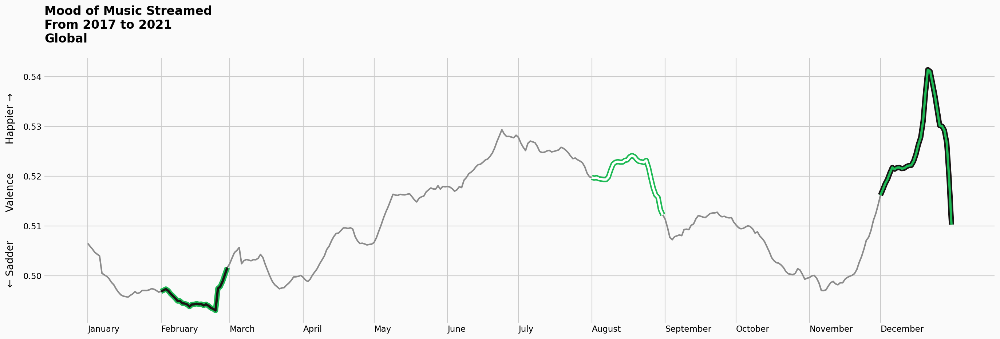

In [40]:
%%time
chart = plot_moving_average(df_valence, 
                            title='Mood of Music Streamed\nFrom 2017 to 2021\nGlobal',
                            filter_country_code=['global'],
                            figsize=(20,6), 
                            dpi=150)

chart.set_ylabel(illustrate_scale.format(*['Sadder', 'Valence', 'Happier']), labelpad=10)
chart.set_xlabel('');

## Year Trend - Line

### code

In [41]:
def plot_line(df, 
              title="title",
              filter_country_code=None,
              figsize=(10, 20), 
              dpi=150):
    
    df_plot = df.copy()
    
    if filter_country_code:
        df_plot = df[df['country_code'].isin(filter_country_code)]
        
    df_plot = df_plot.groupby(['date'])[['valence']].mean() 
    
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    
    chart = df_plot.plot(ax=ax, c='#8b8b8b')
    
    for i in df_plot.index.year.unique():
        for p in dict_period['month']:
            pe_params = [pe.Stroke(linewidth=7, foreground=p[2]), pe.Normal()]
            df_plot.loc[(df_plot.index.month == int(p[0])) & (df_plot.index.year == i)].\
                plot(c=p[1], ax=ax, linewidth=1.2, 
                     path_effects=pe_params)
            ax.get_legend().remove()
    
    ax.set_title(title, x=0, ha='left', fontweight='bold', pad=20)    
    
    plt.xticks(rotation=0, ha='left')
    
    return chart

### chart

CPU times: user 2.02 s, sys: 766 ms, total: 2.78 s
Wall time: 2.8 s


Text(0.5, 0, '')

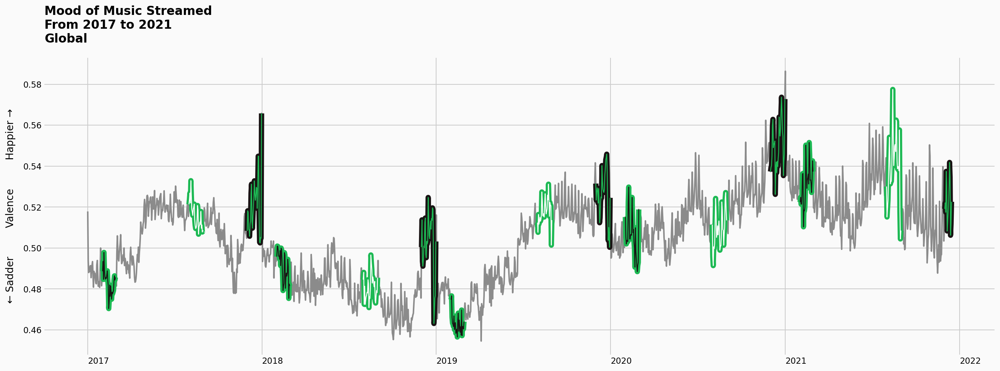

In [42]:
%%time
chart = plot_line(df_valence, 
                  title='Mood of Music Streamed\nFrom 2017 to 2021\nGlobal',
                  filter_country_code=['global'],
                  figsize=(20,8),
                  dpi=150)

chart.set_ylabel(illustrate_scale.format(*['Sadder', 'Valence', 'Happier']), labelpad=10)
chart.set_xlabel('');

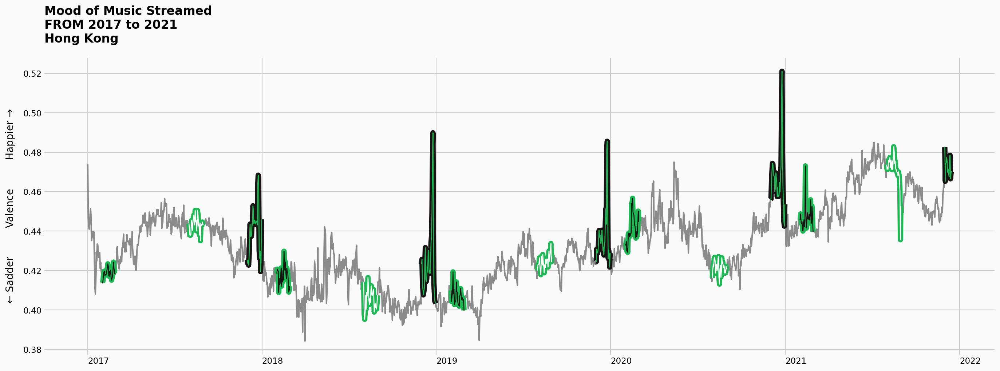

In [43]:
chart = plot_line(df_valence, 
                  title='Mood of Music Streamed\nFROM 2017 to 2021\nHong Kong',
                  filter_country_code=['hk'],
                  figsize=(20,8),
                  dpi=150)

chart.set_ylabel(illustrate_scale.format(*['Sadder', 'Valence', 'Happier']), labelpad=10)
chart.set_xlabel('');

## Month Trend - Scatter

### code

In [44]:
def plot_scatter(df, 
                 y='country', 
                 x='valence', 
                 title="title",
                 period_selected='month', # month or week
                 filter_country_code=None,
                 figsize=(10, 20), 
                 dpi=150):
     
    df_plot = df.copy()
    
    if period_selected == "month":
        period = df.date.dt.month
    if period_selected == "week":
        period = df.date.dt.dayofweek
    if filter_country_code:
        df_plot = df_plot[df_plot['country_code'].isin(filter_country_code)]
    
    df_plot = df_plot.groupby([y, period])[[x]].agg({'valence': weighted_average}, df=df_plot)
    
    df_plot["sort_column"] = df_plot.groupby(y)[[x]].transform('mean')
    df_plot = df_plot.sort_values("sort_column", ascending=False)
    df_plot = df_plot.drop("sort_column", axis=1)
    df_plot = df_plot.reset_index()#.sort_values(x, ascending=False)
    
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    
    chart = df_plot.plot(ax=ax, x=x, y=y, kind='scatter', c='#8b8b8b', s=80, alpha=0.8)
    
    for p in dict_period[period_selected]:
        df_plot.query(f'date == {p[0]}').plot(ax=ax, x=x, y=y, kind='scatter',
                                              c=p[1], s=100, alpha=0.9, 
                                              linewidth=1.2, edgecolor=p[2], label=p[3])    
    
    ax.set_title(title, x=0, ha='left', fontweight='bold', pad=20)
    
    plt.legend(bbox_to_anchor=(1, 1.02, 0, 0), loc="lower right", ncol=10, frameon=False)
    
    return chart

### chart

CPU times: user 8.24 s, sys: 2.07 s, total: 10.3 s
Wall time: 10.5 s


Text(0, 0.5, '')

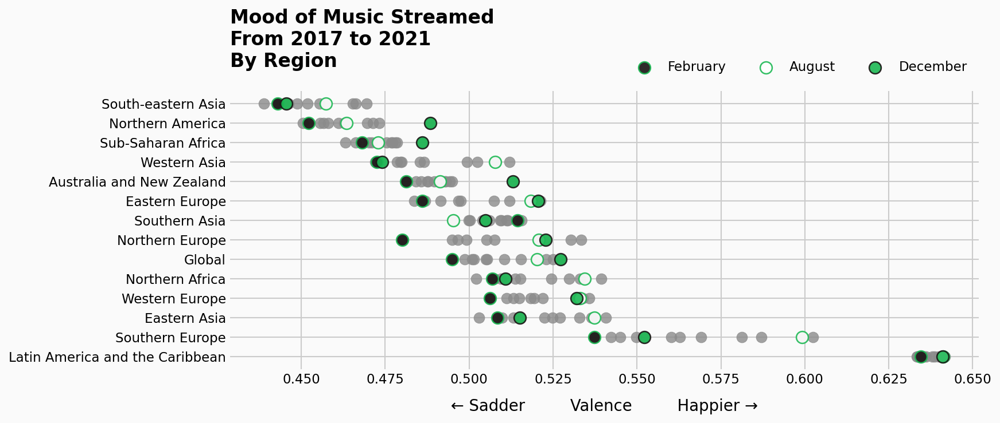

In [45]:
%%time
chart = plot_scatter(df_valence, 
                     y="sub_region_name", 
                     x='valence', 
                     title='Mood of Music Streamed\nFrom 2017 to 2021\nBy Region',
                     period_selected='month',
                     filter_country_code=None,
                     figsize=(10,4),
                     dpi=150)

chart.set_xlabel(illustrate_scale.format(*['Sadder', 'Valence', 'Happier']), labelpad=10)
chart.set_ylabel('');

CPU times: user 8.62 s, sys: 1.82 s, total: 10.4 s
Wall time: 10.4 s


Text(0, 0.5, '')

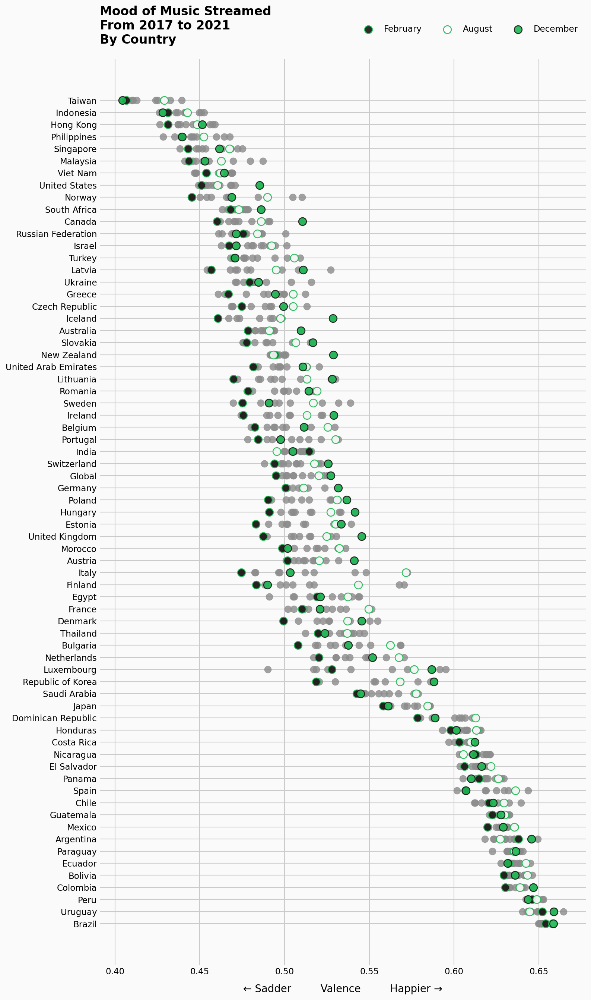

In [46]:
%%time
chart = plot_scatter(df_valence, 
                     y="country", 
                     x='valence', 
                     title='Mood of Music Streamed\nFrom 2017 to 2021\nBy Country',
                     period_selected='month', 
                     filter_country_code=None,
                     figsize=(10,20),
                     dpi=150)

chart.set_xlabel(illustrate_scale.format(*['Sadder', 'Valence', 'Happier']), labelpad=10)
chart.set_ylabel('');

CPU times: user 24.4 s, sys: 2.93 s, total: 27.3 s
Wall time: 27.3 s


Text(0, 0.5, '')

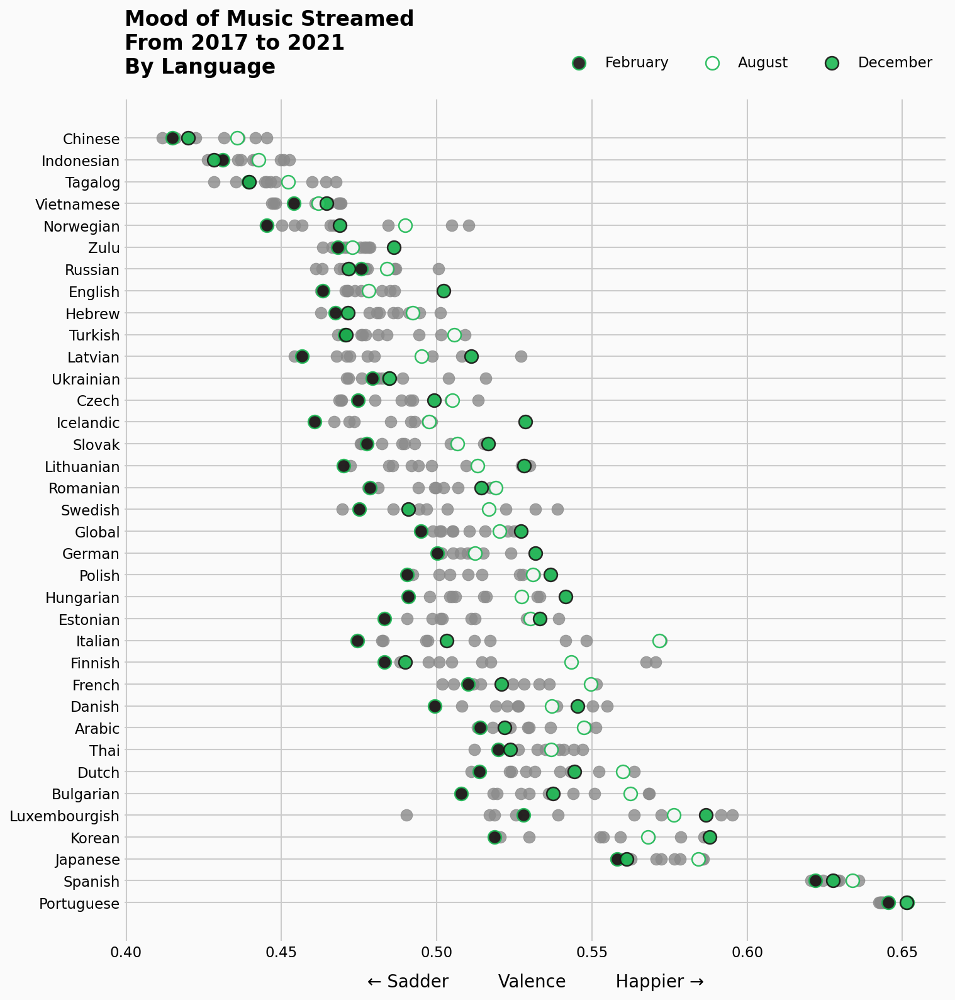

In [47]:
%%time
chart = plot_scatter(df_valence[~df_valence['languages_name'].str.contains("^$|[()]", na=False)],
                     y="languages_name", 
                     x='valence', 
                     title='Mood of Music Streamed\nFrom 2017 to 2021\nBy Language',
                     period_selected='month',
                     filter_country_code=None,
                     figsize=(10,11),
                     dpi=150)

chart.set_xlabel(illustrate_scale.format(*['Sadder', 'Valence', 'Happier']), labelpad=10)
chart.set_ylabel('');

## Ridgeline

### code

In [48]:
def plot_kde(df, 
             y='country', 
             x='valence', 
             title="Ridgeline Plot\nValence\nby Selected Country",
             period_selected='month', 
             list_selected=['Hong Kong', 'United States', 'Global', 'United Kingdom', 'Spain', 'Brazil'],
             colors=['#000000', '#0A290A', '#145214', '#1E7B1E', '#28A428', '#1db954'], #32CD32
             figsize=(16,8), 
             dpi=150):
     
    df_plot = df.copy()
    df_plot = df_plot[~df_plot[x].isna()]
    df_plot = df_plot[df_plot[y].isin(list_selected)]
        
    gs = grid_spec.GridSpec(len(list_selected),1)
    
    fig = plt.figure(figsize=figsize, dpi=dpi)

    i = 0
    ax_objs = []
    list_kde = []
    
    for item in list_selected:
        
        item = list_selected[i]
        
        x = np.array(df_plot[df_plot[y] == item].valence)
        x_d = np.linspace(0, 1, 1000)

        kde = KernelDensity(bandwidth=0.03, kernel='gaussian')
        kde.fit(x[:, None])

        logprob = kde.score_samples(x_d[:, None])

        # creating new axes object
        ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

        # plotting the distribution
        ax_objs[-1].plot(x_d, np.exp(logprob), color="#f0f0f0", lw=1)
        ax_objs[-1].fill_between(x_d, np.exp(logprob), color=colors[i], alpha=1)

        # setting uniform x and y lims
        ax_objs[-1].set_xlim(0, 1)
        ax_objs[-1].set_ylim(0, 2.5)

        # make background transparent
        rect = ax_objs[-1].patch
        rect.set_alpha(0)

        # remove borders, axis ticks, and labels
        ax_objs[-1].set_yticklabels([])
        
        if i == len(list_selected)-1:
            ax_objs[-1].set_xlabel(illustrate_scale.format(*['Sadder', 'Valence', 'Happier']), labelpad=10)
            ax_objs[1].set_title(title, x=0, ha='left', fontweight='bold')
        else:
            ax_objs[-1].set_xticklabels([])

        # adj_country = country.replace(" ","\n")
        ax_objs[-1].text(-0.02, 0, item, ha="right", fontweight="bold")#, fontsize=14,
                     
        ax_objs[-1].grid(False)             
                     
        i += 1
        
        list_kde.append(kde)

    gs.update(hspace=-0.8)

    plt.show()
        
    return gs, list_kde

### chart

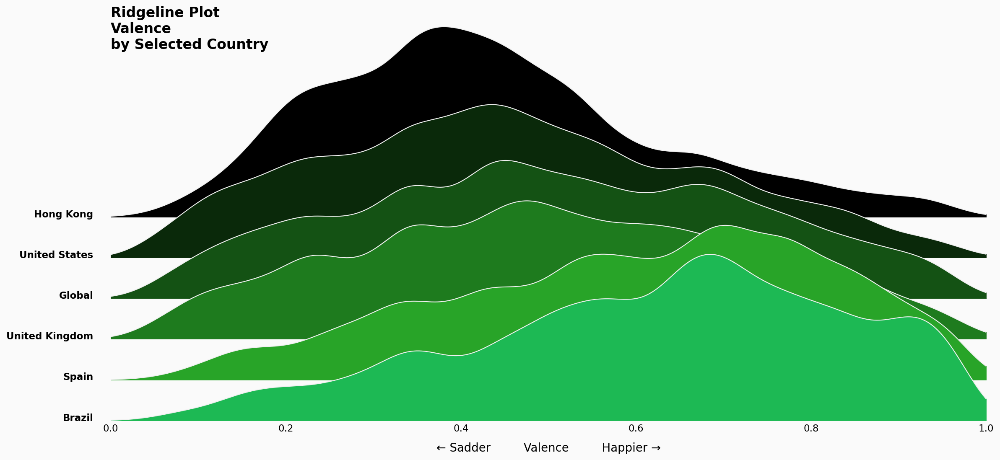

CPU times: user 1min 48s, sys: 2.55 s, total: 1min 51s
Wall time: 1min 51s


In [49]:
%%time
gs_country, kde_country = plot_kde(df_valence, 
                                   y='country', 
                                   x='valence', 
                                   title="Ridgeline Plot\nValence\nby Selected Country",
                                   period_selected='month', 
                                   list_selected=['Hong Kong', 'United States', 'Global', 'United Kingdom', 'Spain', 'Brazil'],
                                   colors=['#000000', '#0A290A', '#145214', '#1E7B1E', '#28A428', '#1db954'],
                                   figsize=(16,8), 
                                   dpi=150)

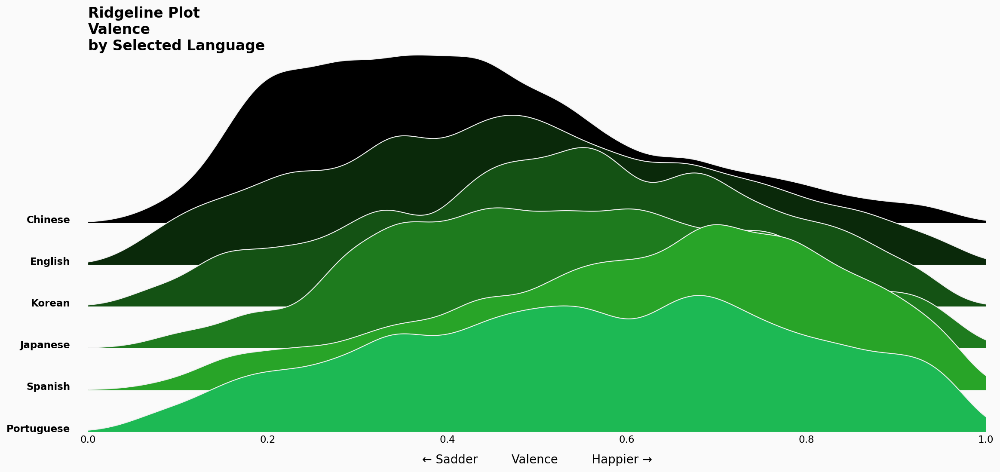

CPU times: user 7min 56s, sys: 10.3 s, total: 8min 6s
Wall time: 8min 10s


In [50]:
%%time
gs_language, kde_language = plot_kde(df_valence[~(df_valence['country'] == 'Global')], 
                                     y='languages_name', 
                                     x='valence', 
                                     title="Ridgeline Plot\nValence\nby Selected Language",
                                     period_selected='month', 
                                     list_selected=['Chinese', 'English', 'Korean', 'Japanese', 'Spanish', 'Portuguese'],
                                     colors=['#000000', '#0A290A', '#145214', '#1E7B1E', '#28A428', '#1db954'],
                                     figsize=(16,8), 
                                     dpi=150)

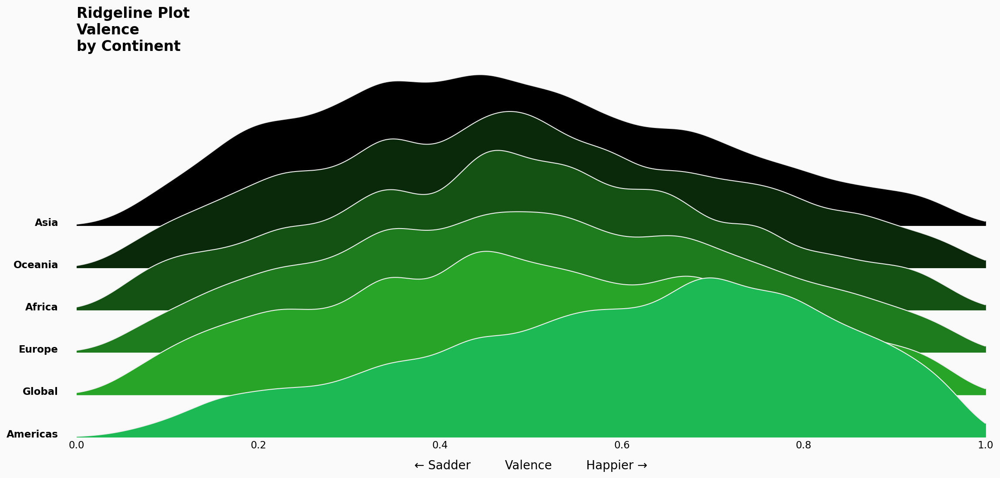

CPU times: user 15min 55s, sys: 15.8 s, total: 16min 11s
Wall time: 2h 45min 13s


In [51]:
%%time
gs_region, kde_region = plot_kde(df_valence, 
                                 y='region_name', 
                                 x='valence', 
                                 title="Ridgeline Plot\nValence\nby Continent",
                                 period_selected='month', 
                                 list_selected=['Asia', 'Oceania', 'Africa', 'Europe', 'Global', 'Americas'],
                                 colors=['#000000', '#0A290A', '#145214', '#1E7B1E', '#28A428', '#1db954'],
                                 figsize=(16,8), 
                                 dpi=150)